# ME314 Final Project: Jack in box

https://colab.research.google.com/drive/1lhn9YEU7dARwj1nOM-lhyBs_GaPM1pfI?usp=sharing


This project is the default option of the course ME314, which siumlate a jack bouncing inside a box.

In this simulation, external force is applied to the box, as the input.

Here are the how the frame are defined.

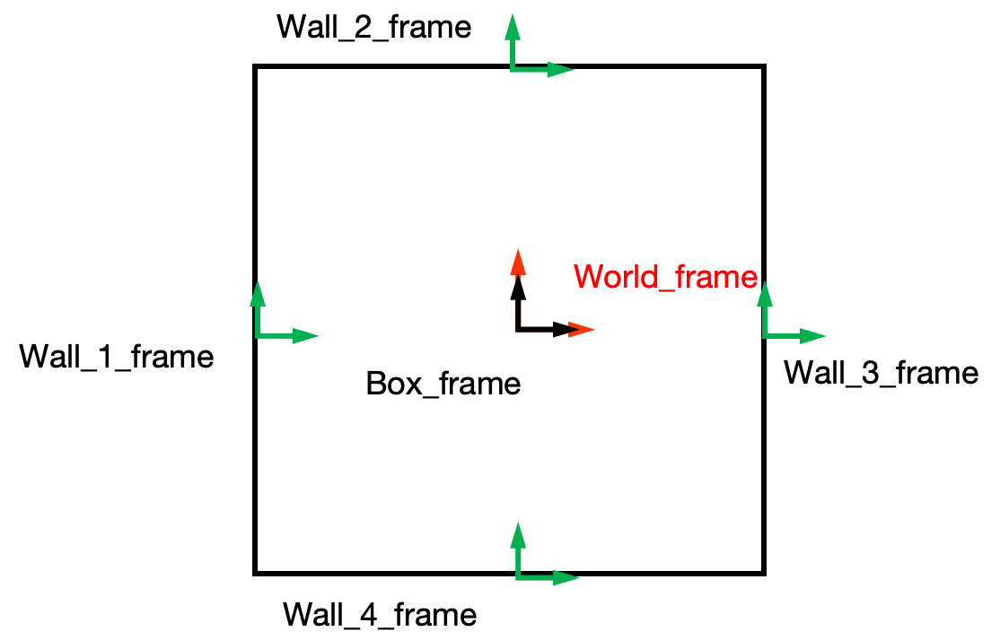

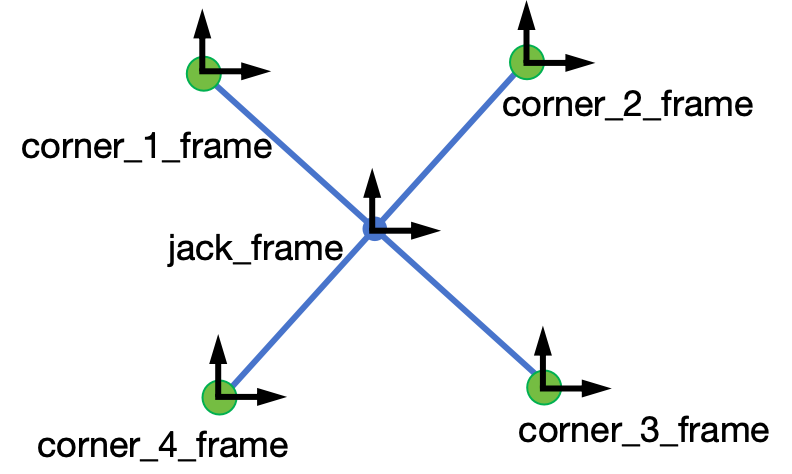

In [ ]:
import numpy as np
import sympy as sym
import matplotlib.pyplot as plt

In [ ]:
# ===== Functions Used for matrix transformation =====
# Computes the inverse of a given SE(3) transformation matrix symbolically
def inverse_se3(se3_mat):
    """
    Computes the inverse of a symbolic SE(3) matrix.
    Args:
        se3_mat: 4x4 symbolic SE(3) transformation matrix.
    Returns:
        4x4 symbolic SE(3) matrix representing the inverse transformation.
    """
    rot = sym.Matrix([[se3_mat[0, 0], se3_mat[0, 1], se3_mat[0, 2]],
                      [se3_mat[1, 0], se3_mat[1, 1], se3_mat[1, 2]],
                      [se3_mat[2, 0], se3_mat[2, 1], se3_mat[2, 2]]])
    pos = sym.Matrix([[se3_mat[0, 3]],
                      [se3_mat[1, 3]],
                      [se3_mat[2, 3]]])
    rot_T = rot.T
    pos_T = -rot_T * pos
    se3_mat_inv = sym.Matrix([[rot_T[0, 0], rot_T[0, 1], rot_T[0, 2], pos_T[0]],
                              [rot_T[1, 0], rot_T[1, 1], rot_T[1, 2], pos_T[1]],
                              [rot_T[2, 0], rot_T[2, 1], rot_T[2, 2], pos_T[2]],
                              [0, 0, 0, 1]])
    return se3_mat_inv


# Extracts a 6D vector (position and rotational part) from a given SE(3) matrix
def unhat_se3(tf_matrix):
    """
    Converts an SE(3) transformation matrix into a 6D vector representation.
    The vector contains the translation components followed by the skew-symmetric components of rotation.
    Args:
        tf_matrix: 4x4 symbolic SE(3) matrix.
    Returns:
        6x1 symbolic vector [x, y, z, omega_x, omega_y, omega_z].
    """
    vector = sym.Matrix([[tf_matrix[0, 3]], [tf_matrix[1, 3]], [tf_matrix[2, 3]],
                         [tf_matrix[2, 1]], [tf_matrix[0, 2]], [tf_matrix[1, 0]]])
    return vector



# Creates a symbolic SE(3) transformation matrix from position and rotation (theta)
def tf_matrix_sym(pos, theta):
    """
    Constructs a symbolic SE(3) transformation matrix given position and rotation.
    Args:
        pos: 3x1 symbolic vector [x, y, z] for translation.
        theta: Symbolic angle representing rotation about the z-axis.
    Returns:
        4x4 symbolic SE(3) transformation matrix.
    """
    sym_matrix = sym.Matrix([[sym.cos(theta), -sym.sin(theta), 0, pos[0]],
                          [sym.sin(theta),  sym.cos(theta), 0, pos[1]],
                          [ 0, 0, 1, pos[2]],
                          [ 0, 0, 0, 1]])
    return sym_matrix

# Creates a numerical SE(3) transformation matrix using numpy
def tf_matrix_np(theta, pos):
    """
    Constructs a numerical SE(3) transformation matrix given position and rotation.
    Args:
        pos: 3x1 numpy array [x, y, z] for translation.
        theta: Angle in radians representing rotation about the z-axis.
    Returns:
        4x4 numpy SE(3) transformation matrix.
    """
    np_matrix = np.array([[np.cos(theta), -np.sin(theta), 0, pos[0]],
                          [np.sin(theta),  np.cos(theta), 0, pos[1]],
                          [0, 0, 1, pos[2]],
                          [0, 0, 0, 1]])
    return np_matrix

# Computes the body velocity vector symbolically from a transformation matrix
def compute_vb(tf_matrix):
    """
    Computes the body velocity vector (6D) from a given SE(3) transformation matrix.
    Uses the time derivative of the matrix and SE(3) inverse.
    Args:
        tf_matrix: 4x4 symbolic SE(3) transformation matrix.
    Returns:
        6x1 symbolic body velocity vector.
    """
    vb = unhat_se3(inverse_se3(tf_matrix) * tf_matrix.diff(t))
    return vb

# Constructs a symbolic inertia matrix for a 6D system (mass + rotational inertia)
def find_inertia_matrix(m, J):
    """
    Constructs a symbolic 6x6 inertia matrix.
    Args:
        m: Mass of the body.
        J: Rotational inertia about the z-axis.
    Returns:
        6x6 symbolic inertia matrix.
    """
    inertia_mat = sym.Matrix([[m, 0, 0, 0, 0, 0],
                              [0, m, 0, 0, 0, 0],
                              [0, 0, m, 0, 0, 0],
                              [0, 0, 0, 0, 0, 0],
                              [0, 0, 0, 0, 0, 0],
                              [0, 0, 0, 0, 0, J]])
    return inertia_mat


In [ ]:
# =====Simulation Functions======

def impact_update(s, impact_eq, subs_plus, phi_val):
    """Update state after impact using solved dynamics."""
    eq_subs = impact_eq.subs({xb: s[0], yb: s[1], thetab: s[2], xj: s[3],
                              yj: s[4], thetaj: s[5], dxb: s[6], dyb: s[7],
                              dthetab: s[8], dxj: s[9], dyj: s[10],
                              dthetaj: s[11]})

    impact_solns = sym.solve([eq_subs], [dxb_p, dyb_p, dthetab_p, dxj_p, dyj_p, dthetaj_p, lam], dict=True)

    if len(impact_solns) == 1:
        pass
    else:
        for sol in impact_solns:
            sol_lam = sol[lam]
            if (abs(sol_lam) == sol_lam) == (abs(phi_val) == phi_val):
                output = np.array([float(s[0]), float(s[1]), float(s[2]),
                                   float(s[3]), float(s[4]), float(s[5]),
                                   float(sol[dummy_plus[0]]), float(sol[dummy_plus[1]]), float(sol[dummy_plus[2]]),
                                   float(sol[dummy_plus[3]]), float(sol[dummy_plus[4]]), float(sol[dummy_plus[5]])])
    return output


def check_for_impact(s, phi_sol, thresh=0.25):
    """Check if impact conditions are met."""
    phi_val = phi_sol(s)
    for i in range(phi_val.shape[0]):
        if -thresh < phi_val[i] < thresh:
            return (True, i, phi_val[i][0])
    return (False, None)


def integrate(f, xt, dt, time):
    """Numerically integrate one time step using 4th-order Runge-Kutta."""
    k1 = dt * f(xt, time)
    k2 = dt * f(xt + k1 / 2.0, time)
    k3 = dt * f(xt + k2 / 2.0, time)
    k4 = dt * f(xt + k3, time)
    return xt + (1 / 6.0) * (k1 + 2.0 * k2 + 2.0 * k3 + k4)


def simulate(f, x0, tspan, dt, integrate, phi_sol):
    """Simulate system dynamics over a time span."""
    N = int((tspan[1] - tspan[0]) / dt)
    x = np.copy(x0)
    tvec = np.linspace(tspan[0], tspan[1], N)
    xtraj = np.zeros((len(x0), N))
    time = 0.0

    for i in range(N):
        time += dt
        xtraj[:, i] = integrate(f, x, dt, time)
        x = np.copy(xtraj[:, i])
        impact = check_for_impact(x, phi_sol)

        if impact[0]:
            x = np.copy(xtraj[:, i - 1])
            eq_num = impact[1]
            x = impact_update(x, impact_eqs[eq_num], dummy_plus, impact[2])

    return xtraj


def dyn(s, time):
    """Compute time derivatives of the system state."""
    x_box_ddot = xddot_box_sol(*s, time)
    y_box_ddot = yddot_box_sol(*s, time)
    theta_box_ddot = thetaddot_box_sol(*s, time)
    x_jack_ddot = xddot_jack_sol(*s, time)
    y_jack_ddot = yddot_jack_sol(*s, time)
    theta_jack_ddot = thetaddot_jack_sol(*s, time)

    return np.array([s[6], s[7], s[8], s[9], s[10], s[11],
                     x_box_ddot, y_box_ddot, theta_box_ddot,
                     x_jack_ddot, y_jack_ddot, theta_jack_ddot])


In [ ]:
# ===== Animation and Results plotting =====

def animate_jack(theta_array, L_box, L_jack, T):
    """
    Function to generate animation of a jack in a box

    Parameters:
    - theta_array:
        trajectory of xb, yb, thetab, xj, yj, thetaj
    - L_box:
        length of the box
    - L_jack:
        length of the jack
    - T:
        length/seconds of animation duration

    Returns: None
    """

    ################################
    # Imports required for animation.
    from plotly.offline import init_notebook_mode, iplot
    from IPython.display import display, HTML
    import plotly.graph_objects as go

    #######################
    # Browser configuration.
    def configure_plotly_browser_state():
        import IPython
        display(IPython.core.display.HTML('''
            <script src="/static/components/requirejs/require.js"></script>
            <script>
              requirejs.config({
                paths: {
                  base: '/static/base',
                  plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
                },
              });
            </script>
            '''))
    configure_plotly_browser_state()
    init_notebook_mode(connected=False)

    ###############################################
    # Get data from imported trajectory
    N = len(theta_array[0])
    xb_array = theta_array[0]
    yb_array = theta_array[1]
    thetab_array = theta_array[2]
    xj_array = theta_array[3]
    yj_array = theta_array[4]
    thetaj_array = theta_array[5]

    ###############################################
    # Define arrays with frame data
    # Box
    frame_box1_x = np.zeros(N)
    frame_box1_y = np.zeros(N)
    frame_box2_x = np.zeros(N)
    frame_box2_y = np.zeros(N)
    frame_box3_x = np.zeros(N)
    frame_box3_y = np.zeros(N)
    frame_box4_x = np.zeros(N)
    frame_box4_y = np.zeros(N)
    # Jack
    frame_jack1_x = np.zeros(N)
    frame_jack1_y = np.zeros(N)
    frame_jack2_x = np.zeros(N)
    frame_jack2_y = np.zeros(N)
    frame_jack3_x = np.zeros(N)
    frame_jack3_y = np.zeros(N)
    frame_jack4_x = np.zeros(N)
    frame_jack4_y = np.zeros(N)

    for i in range(N):
        g_wb = tf_matrix_np(thetab_array[i], [xb_array[i], yb_array[i], 0])
        g_wj = tf_matrix_np(thetaj_array[i], [xj_array[i], yj_array[i], 0])
        # Box
        frame_box1_x[i] = (g_wb.dot(([L_box/2, L_box/2, 0, 1])))[0]
        frame_box1_y[i] = (g_wb.dot(([L_box/2, L_box/2, 0, 1])))[1]
        frame_box2_x[i] = (g_wb.dot(([L_box/2, -L_box/2, 0, 1])))[0]
        frame_box2_y[i] = (g_wb.dot(([L_box/2, -L_box/2, 0, 1])))[1]
        frame_box3_x[i] = (g_wb.dot(([-L_box/2, -L_box/2, 0, 1])))[0]
        frame_box3_y[i] = (g_wb.dot(([-L_box/2, -L_box/2, 0, 1])))[1]
        frame_box4_x[i] = (g_wb.dot(([-L_box/2, L_box/2, 0, 1])))[0]
        frame_box4_y[i] = (g_wb.dot(([-L_box/2, L_box/2, 0, 1])))[1]
        # Jack
        frame_jack1_x[i] = (g_wj.dot(([L_jack/2, L_jack/2, 0, 1])))[0]
        frame_jack1_y[i] = (g_wj.dot(([L_jack/2, L_jack/2, 0, 1])))[1]
        frame_jack2_x[i] = (g_wj.dot(([L_jack/2, -L_jack/2, 0, 1])))[0]
        frame_jack2_y[i] = (g_wj.dot(([L_jack/2, -L_jack/2, 0, 1])))[1]
        frame_jack3_x[i] = (g_wj.dot(([-L_jack/2, -L_jack/2, 0, 1])))[0]
        frame_jack3_y[i] = (g_wj.dot(([-L_jack/2, -L_jack/2, 0, 1])))[1]
        frame_jack4_x[i] = (g_wj.dot(([-L_jack/2, L_jack/2, 0, 1])))[0]
        frame_jack4_y[i] = (g_wj.dot(([-L_jack/2, L_jack/2, 0, 1])))[1]

    ####################################
    # x-y axis limits.
    xm = -8
    xM = 8
    ym = -8
    yM = 8

    ###########################
    # Defining data dictionary.
    # Trajectories are here.
    data=[
        dict(name='Box'),
        dict(name='Jack'),
        dict(name='Jack massless rod'),
        dict(name='Jack massless rod'),
        ]

    ################################
    # Preparing simulation layout.
    # Title and axis ranges are here.
    layout=dict(autosize=False, width=1000, height=1000,
                xaxis=dict(range=[xm, xM], autorange=False, zeroline=False,dtick=1),
                yaxis=dict(range=[ym, yM], autorange=False, zeroline=False,scaleanchor = "x",dtick=1),
                title='Jack Simulation',
                hovermode='closest',
                updatemenus= [{'type': 'buttons',
                               'buttons': [{'label': 'Start','method': 'animate',
                                            'args': [None, {'frame': {'duration': T, 'redraw': False}}]},
                                           {'args': [[None], {'frame': {'duration': T, 'redraw': False}, 'mode': 'immediate',
                                            'transition': {'duration': 0}}],'label': 'Stop','method': 'animate'}
                                          ]
                              }]
               )

    ########################################
    # Defining the frames of the simulation.
    frames=[dict(data=[
                      #################### BOX LINES ############################
                      dict(x=[frame_box1_x[k], frame_box2_x[k], frame_box3_x[k], frame_box4_x[k], frame_box1_x[k]],
                           y=[frame_box1_y[k], frame_box2_y[k], frame_box3_y[k], frame_box4_y[k], frame_box1_y[k]],
                           mode='lines',
                           line=dict(color='black', width=5),
                           ),
                      #################### JACK POINT MASSES ############################
                      go.Scatter(
                            x=[frame_jack1_x[k], frame_jack2_x[k], frame_jack3_x[k], frame_jack4_x[k]],
                            y=[frame_jack1_y[k], frame_jack2_y[k], frame_jack3_y[k], frame_jack4_y[k]],
                            mode="markers",
                            marker=dict(color="green", size=12)),
                       #################### JACK POINT LINES ############################
                       dict(x=[frame_jack1_x[k], frame_jack3_x[k]],
                            y=[frame_jack1_y[k], frame_jack3_y[k]],
                            mode='lines',
                            line=dict(color='blue', width=2),
                            ),
                       dict(x=[frame_jack2_x[k], frame_jack4_x[k]],
                            y=[frame_jack2_y[k], frame_jack4_y[k]],
                            mode='lines',
                            line=dict(color='blue', width=2),
                            ),
                      ]) for k in range(N)]

    #######################################
    # Putting it all together and plotting.
    figure1=dict(data=data, layout=layout, frames=frames)
    iplot(figure1)


def plot(traj, tspan, dt):
  """
  Plot box and jack motion.
  """
  x_t = np.linspace(tspan[0], tspan[1], int(tspan[1]/dt))

  plt.figure()
  plt.plot(x_t, traj[0], label=r'$x_b(t)$')
  plt.plot(x_t, traj[1], label=r'$y_b(t)$')
  plt.title('Box $x_b$, $y_b$ vs Time(t)')
  plt.xlabel('t')
  plt.legend(loc='upper left')
  plt.show()

  plt.figure()
  plt.plot(x_t, traj[3], label=r'$x_j(t)$')
  plt.plot(x_t, traj[4], label=r'$y_j(t)$')
  plt.title('Jack $x_j$, $y_j$ vs Time(t)')
  plt.xlabel('t')
  plt.legend(loc='upper left')
  plt.show()

  plt.figure()
  plt.plot(x_t, traj[0], label=r'$x_b(t)$')
  plt.plot(x_t, traj[1], label=r'$y_b(t)$')
  plt.plot(x_t, traj[3], label=r'$x_j(t)$')
  plt.plot(x_t, traj[4], label=r'$y_j(t)$')
  plt.title('Box and Jack $x_b$, $y_b$, $x_j$, $y_j$ vs Time(t)')
  plt.xlabel('t')
  plt.legend(loc='upper left')
  plt.show()

  plt.figure()
  plt.plot(x_t, traj[2], label=r'$\theta_b(t)$')
  plt.plot(x_t, traj[5], label=r'$\theta_j(t)$')
  plt.title('Box and Jack $theta$ vs Time(t)')
  plt.xlabel('t')
  plt.legend(loc='upper left')
  plt.show()

In [ ]:
# =====Define parameteres=====

# Box
box_length = 10
box_mass = 5
box_J = (box_mass/12) * (box_length)**2 # intertia about zaxis

# dice
jack_length = 1 # x/y side length of the jack
jack_mass = 1
jack_J = jack_mass * (4 * (jack_length/2)**2) # intertia about zaxis

# Gravity
g = 9.81
t, lam = sym.symbols('t, \lambda')
# ======Defein Functions=======
x_box = sym.Function('x_box')(t)
y_box = sym.Function('y_box')(t)
theta_box = sym.Function('theta_box')(t)

x_jack = sym.Function('x_jack')(t)
y_jack = sym.Function('y_jack')(t)
theta_jack = sym.Function('theta_jack')(t)

# ======transformation =========
# box and dice center relative to world frame
g_w_box = tf_matrix_sym([x_box, y_box, 0.0], theta_box)
g_w_jack = tf_matrix_sym([x_jack, y_jack, 0.0], theta_jack)

# box walls relative to box center
g_box_wall1 = tf_matrix_sym([box_length/2, 0.0, 0.0], 0.0)
g_box_wall2 = tf_matrix_sym([0.0, -box_length/2, 0.0], 0.0)
g_box_wall3 = tf_matrix_sym([-box_length/2, 0.0, 0.0], 0.0)
g_box_wall4 = tf_matrix_sym([0.0, box_length/2, 0.0], 0.0)

# Define jack corners relative to jack center
g_jack_corner1 = tf_matrix_sym([jack_length/2, jack_length/2, 0.0], 0.0)
g_jack_corner2 = tf_matrix_sym([jack_length/2, -jack_length/2, 0.0], 0.0)
g_jack_corner3 = tf_matrix_sym([-jack_length/2, -jack_length/2, 0.0], 0.0)
g_jack_corner4 = tf_matrix_sym([-jack_length/2, jack_length/2, 0.0], 0.0)

# Box walls relative to world frame
g_w_wall1 = g_w_box @ g_box_wall1
g_w_wall2 = g_w_box @ g_box_wall2
g_w_wall3 = g_w_box @ g_box_wall3
g_w_wall4 = g_w_box @ g_box_wall4

# Jack corners relative to world frame
g_w_corner1 = g_w_jack @ g_jack_corner1
g_w_corner2 = g_w_jack @ g_jack_corner2
g_w_corner3 = g_w_jack @ g_jack_corner3
g_w_corner4 = g_w_jack @ g_jack_corner4

# Velocities of box and jack relative to world frame
box_vel = compute_vb(g_w_box)
jack_vel = compute_vb(g_w_jack)

# Inertia matrices for box and jack
box_I = find_inertia_matrix(box_mass, box_J)
jack_I = find_inertia_matrix(jack_mass, jack_J)

In [ ]:
# ======Euler-Lagrangian=========
# compute KE
KE_box = 0.5 * (box_vel.T) * box_I * box_vel
KE_jack = 0.5 * (jack_vel.T) * jack_I * jack_vel
KE = (KE_box + KE_jack)[0]

# compute PE
PE_box = g * box_mass * y_box
PE_jack = g * jack_mass * y_jack
PE = PE_box + PE_jack

# Lagrangian
L = KE-PE
L = sym.simplify(L)

# State variable
q = sym.Matrix([x_box, y_box, theta_box, x_jack, y_jack, theta_jack])
qdot = q.diff(t)
qddot = qdot.diff(t)

dLdq = sym.Matrix([L]).jacobian(q)
dLdqdot = sym.Matrix([L]).jacobian(qdot)

# Euler-lagrangain
el_lhs = dLdqdot.diff(t) - dLdq
el_lhs = el_lhs.T

# Calculate force matrix, right hand side
F_y_box = (box_mass + jack_mass) * g
F_theta_box = 1 * (box_mass * g)
F_matrix = sym.Matrix([0, F_y_box, F_theta_box, 0, 0, 0])

# Euler Lagrange Equations
el_eqns = sym.Eq(el_lhs, F_matrix)
# Solve for qddot
el_eqns_solved = sym.solve(el_eqns, qddot, dict=True)

# Define dummy variables for substitution
xb, yb, thetab, xj, yj, thetaj = sym.symbols(r'x_b, y_b, \theta_b, x_j, y_j, \theta_j')
dxb, dyb, dthetab, dxj, dyj, dthetaj = sym.symbols(r'\dot{x_b}, \dot{y_b}, \dot{\theta_b}, \dot{x_j}, \dot{y_j}, \dot{\theta_j}')

# Dummy variable mappings
dummy_minus = {q[0]: xb, q[1]: yb, q[2]: thetab,
               q[3]: xj, q[4]: yj, q[5]: thetaj,
               qdot[0]: dxb, qdot[1]: dyb, qdot[2]: dthetab,
               qdot[3]: dxj, qdot[4]: dyj, qdot[5]: dthetaj}

dxb_p, dyb_p, dthetab_p, dxj_p, dyj_p, dthetaj_p = sym.symbols(r'\dot{x_b}^+, \dot{y_b}^+, \dot{\theta_b}^+, \dot{x_j}^+, \dot{y_j}^+, \dot{\theta_j}^+')

# After impact dummy variable mappings
dummy_after_impact = {dxb: dxb_p, dyb: dyb_p, dthetab: dthetab_p,
                      dxj: dxj_p, dyj: dyj_p, dthetaj: dthetaj_p}

dummy_plus = [dxb_p, dyb_p, dthetab_p, dxj_p, dyj_p, dthetaj_p]

In [ ]:
# =====Constrains=====
# Transformations between walls and jack corners
walls = [g_w_wall1, g_w_wall2, g_w_wall3, g_w_wall4]
corners = [g_w_corner1, g_w_corner2, g_w_corner3, g_w_corner4]

# Generate all transformations using nested loops
g_wall_corner = {}
for i, wall in enumerate(walls, 1):
    for j, corner in enumerate(corners, 1):
        g_wall_corner[f"wall{i}_corner{j}"] = inverse_se3(wall) @ corner

# Impact constraints for walls and jack corners
phi_wall_corner = {}
for key, transform in g_wall_corner.items():
    wall_index = int(key[4])  # Extract wall index from key
    axis = 0 if wall_index in [1, 3] else 1  # Use x-axis for walls 1 & 3, y-axis for walls 2 & 4
    phi_wall_corner[key] = transform[axis, 3].subs(dummy_minus)

# display(phi_wall_corner['wall1_corner1'])
# Impact constraint matrix
phi_constraint = sym.Matrix([[phi_wall_corner['wall1_corner1']], [phi_wall_corner['wall1_corner2']], [phi_wall_corner['wall1_corner3']], [phi_wall_corner['wall1_corner4']],
                             [phi_wall_corner['wall2_corner1']], [phi_wall_corner['wall2_corner2']], [phi_wall_corner['wall2_corner3']], [phi_wall_corner['wall2_corner4']],
                             [phi_wall_corner['wall3_corner1']], [phi_wall_corner['wall3_corner2']], [phi_wall_corner['wall3_corner3']], [phi_wall_corner['wall3_corner4']],
                             [phi_wall_corner['wall4_corner1']], [phi_wall_corner['wall4_corner2']], [phi_wall_corner['wall4_corner3']], [phi_wall_corner['wall4_corner4']],])
# display(phi_constraint)

In [ ]:
# Lamdify qddot equations ans phi constraints
xddot_box_sol = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5], qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5], t], el_eqns_solved[0][qddot[0]], modules = [np, sym], dummify=True)
yddot_box_sol = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5], qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5], t], el_eqns_solved[0][qddot[1]], modules = [np, sym], dummify=True)
thetaddot_box_sol = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5], qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5], t], el_eqns_solved[0][qddot[2]], modules = [np, sym], dummify=True)
xddot_jack_sol = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5], qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5], t], el_eqns_solved[0][qddot[3]], modules = [np, sym], dummify=True)
yddot_jack_sol = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5], qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5], t], el_eqns_solved[0][qddot[4]], modules = [np, sym], dummify=True)
thetaddot_jack_sol = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5], qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5], t], el_eqns_solved[0][qddot[5]], modules = [np, sym], dummify=True)
phi_sols = sym.lambdify([[xb, yb, thetab, xj, yj, thetaj, dxb, dyb, dthetab, dxj, dyj, dthetaj]], phi_constraint, modules = [np, sym], dummify=True)

# ===== Impacts =====
# Calculate Hamiltonian and t- and t+
H = (dLdqdot * qdot)[0] - L
H_subs_minus = H.subs(dummy_minus)
H_subs_plus = H_subs_minus.subs(dummy_after_impact)
dLdqdot_minus = dLdqdot.subs(dummy_minus)
dLdqdot_plus = dLdqdot_minus.subs(dummy_after_impact)
dphidq_minus = phi_constraint.jacobian([xb, yb, thetab, xj, yj, thetaj])
dphidq_plus = dphidq_minus.subs(dummy_after_impact)

# Define impact equations
impact_lhs = sym.simplify(sym.Matrix([dLdqdot_plus[0] - dphidq_minus[0],
                                      dLdqdot_plus[1] - dphidq_minus[1],
                                      dLdqdot_plus[2] - dphidq_minus[2],
                                      dLdqdot_plus[3] - dphidq_minus[3],
                                      dLdqdot_plus[4] - dphidq_minus[4],
                                      dLdqdot_plus[5] - dphidq_minus[5],
                                      H_subs_plus - H_subs_minus]))

impact_eqs = []
for i in range(phi_constraint.shape[0]):
    impact_rhs = sym.Matrix([lam * dphidq_minus[i, 0],
                            lam * dphidq_minus[i, 1],
                            lam * dphidq_minus[i, 2],
                            lam * dphidq_minus[i, 3],
                            lam * dphidq_minus[i, 4],
                            lam * dphidq_minus[i, 5],
                            0])
    impact_eqs.append(sym.Eq(impact_lhs, impact_rhs))


In [ ]:
# ===== Simulation =====

sim_time = 15
dt = 0.01

tspan = [0, sim_time]
s0 = np.array([0, 0, np.pi/4, 2, 2, np.pi/4, 0, 0, 0, 0, 0, 0])

traj = simulate(dyn, s0, tspan, dt, integrate, phi_sols)

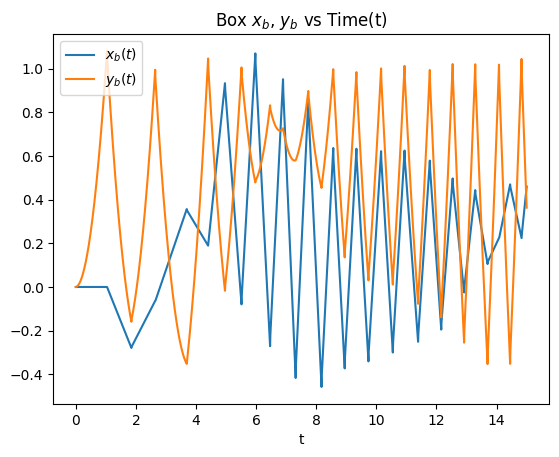

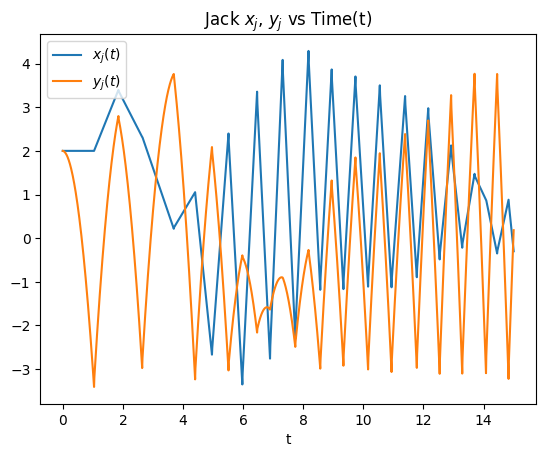

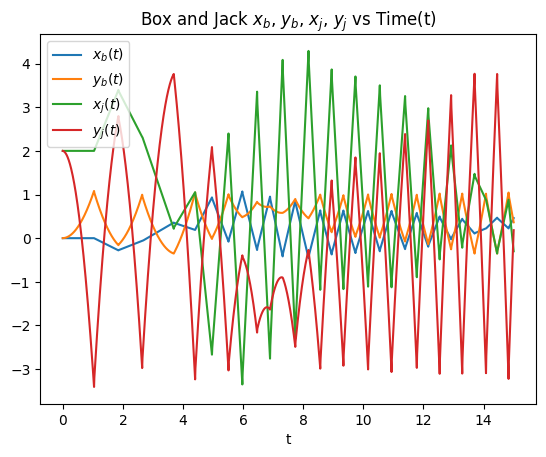

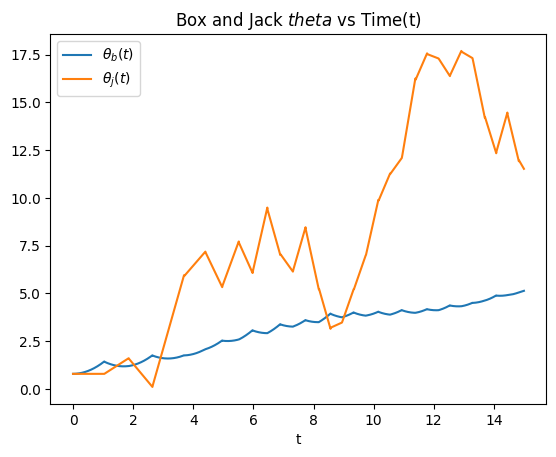

In [ ]:
# Plot X, Y, and Theta for the box and the jack
plot(traj, tspan, dt)

In [ ]:
# Animate!
animate_jack(traj, box_length, jack_length, sim_time)